- Python에서 데이터 시각화할 때 사용하는 다양한 라이브러리를 정리한 글입니다
- 데이터 분석가들은 주로 Python(또는 R, SQL)을 가지고 데이터 분석을 합니다
    - R에는 ggplot이란 시각화에 좋은 라이브러리가 있는 반면 Python에는 어느 춘추전국시대처럼 다양한 라이브러리들이 있습니다
    - 각 라이브러리들마다 특징이 있기 때문에 필요에 의해 자유롭게 사용하면 좋을 것 같습니다
    - Zeppelin도 시각화할 때 사용할 수 있지만, 라이브러리는 아니기 때문에 이 문서에선 다루지 않습니다
- 저는 Jupyter Notebook으로 레포트를 작성해, 레포트의 보는 사람이 누구인지에 따라 다르게 그래프를 그렸습니다
    - 직접 그래프를 더 탐색해보고 싶은 목적이 있는 분들에게 보내는 그래프라면 동적인(Interactive) 그래프를 그렸습니다
    - 반복적인 레포트는 정적인 그래프 기반으로 작성한 후, 추가적인 내용이 궁금하면 대시보드로 가도록 유도했습니다
- 이 문서는 맥북에서 작성되었으며, 부족한 내용이 있으면 연락주세요 :)
- 라이브러리
    - ```matplotlib```
    - ```seaborn```
    - ```bokeh```
    - ```plotnine```
    - ```folium```
    - ```plot.ly```
    - ```pyecharts```

## Matplotlib
---

- Python에서 아마 가장 많이 쓰는 라이브러리입니다
- ```pandas```의 Dataframe을 바로 시각화할 때도 내부적으로 matplotlib을 사용합니다
- 설치
    ```
    pip3 install matplotlib
    ```
- [Matplotlib Tutorials](https://matplotlib.org/tutorials/index.html)
- [데이터 사이언스 스쿨](https://datascienceschool.net/view-notebook/d0b1637803754bb083b5722c9f2209d0/)

In [20]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

print("Matplotlib version", matplotlib.__version__)
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

Matplotlib version 2.2.3


### Figure의 구성 요소

<img src="https://www.dropbox.com/s/oqc1qxb12m8e9hi/%EC%8A%A4%ED%81%AC%EB%A6%B0%EC%83%B7%202018-08-24%2017.03.16.png?raw=1" height="700" width="700">
- 처음 matplotlib을 사용해 그래프를 그릴 때, 그래프와 관련된 명칭을 (영어 표현으로) 몰라 애를 먹었습니다
- 여기 나온 표현을 숙지해두기만 해도 좋을 것 같습니다

### Figure
- Figure는 그림이 그려지는 도화지라고 생각할 수 있습니다
    - 우선 Figure를 그린 후, ```plt.subplots```로 도화지를 분할해 각 부분에 그래프를 그리는 방식으로 진행합니다
    - ```plt.figure```를 명시적으로 표현해주는 것이 좋으나, plot 함수에서 자동으로 figure를 생성하기 때문에 자주 사용하진 않습니다
    - 그러나 현재 figure에 접근해야 할 필요성이 있다면, ```plt.gcf()```로 접근할 수 있습니다
- size를 조절하고 싶은 경우엔 ```fig.set_size_inches(18.5, 10.5)```
    - 또는 ```plt.figure(figsize=(10,5))```
    - 또는 ```plt.rcParams['figure.figsize'] = (10,7)```

### Axes
- Axes는 plot이 그려지는 공간입니다

### Axis
- plot의 축입니다

<img src="https://www.dropbox.com/s/2n4hgu3db5t8twq/%EC%8A%A4%ED%81%AC%EB%A6%B0%EC%83%B7%202018-08-24%2017.45.14.png?raw=1" height="300" width="300">

<Figure size 432x288 with 0 Axes>

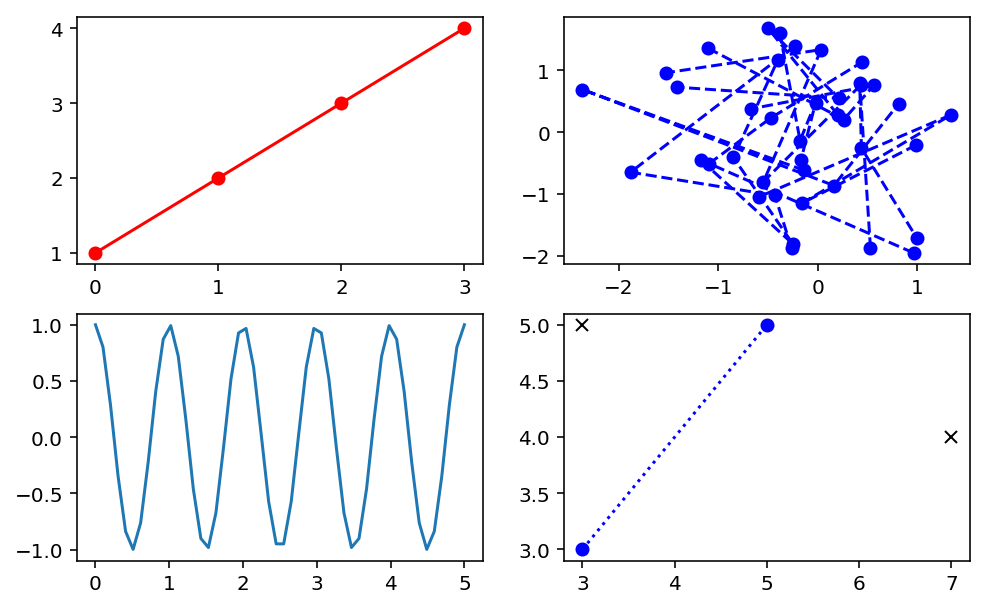

In [2]:
fig = plt.figure()
fig.suptitle('figure sample plots')  

fig, ax_lst = plt.subplots(2, 2, figsize=(8,5))  

ax_lst[0][0].plot([1,2,3,4], 'ro-')
ax_lst[0][1].plot(np.random.randn(4, 10), np.random.randn(4,10), 'bo--')
ax_lst[1][0].plot(np.linspace(0.0, 5.0), np.cos(2 * np.pi * np.linspace(0.0, 5.0)))
ax_lst[1][1].plot([3,5], [3,5], 'bo:')
ax_lst[1][1].plot([3,7], [5,4], 'kx')
plt.show()

In [3]:
df = pd.DataFrame(np.random.randn(4,4))

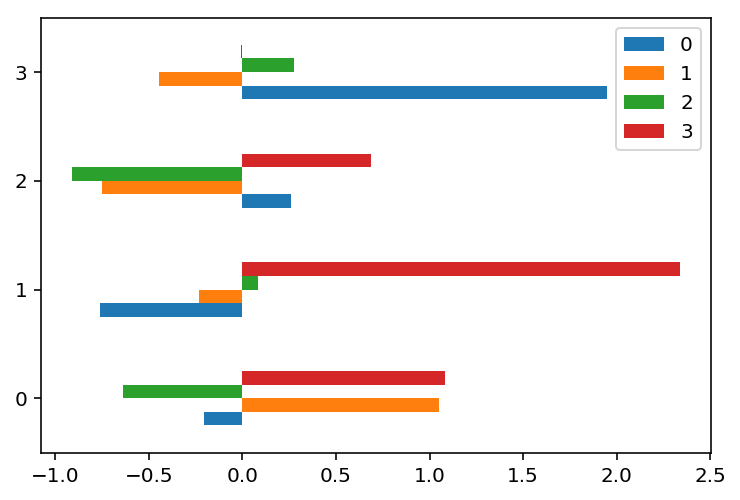

In [4]:
df.plot(kind='barh')

- ggplot 스타일로 그리고 싶다면 아래 옵션 추가

```
plt.style.use('ggplot')
pd.options.display.mpl_style = 'default'
```

<Figure size 432x288 with 0 Axes>

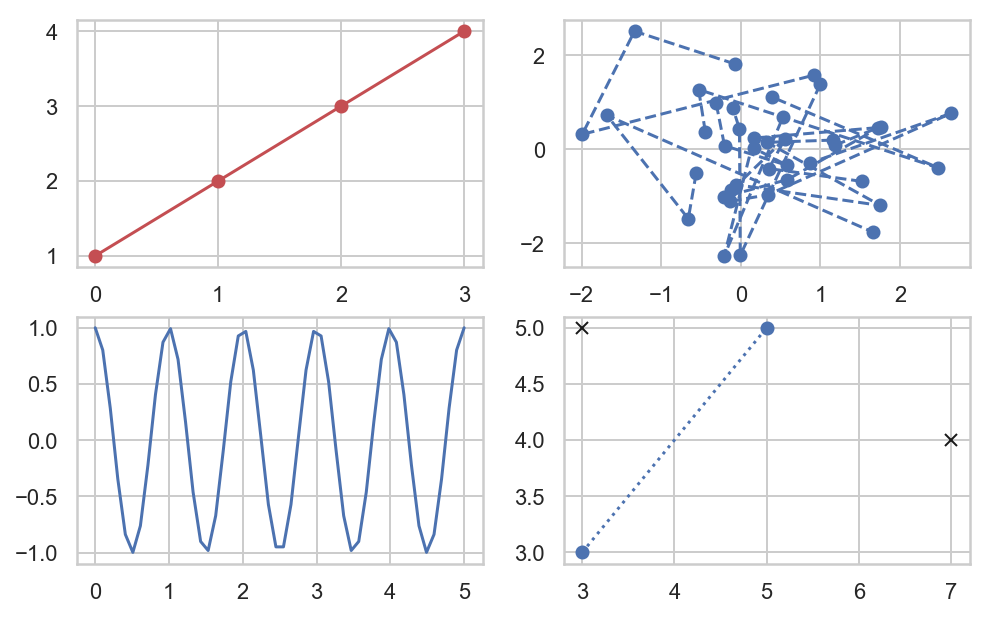

In [30]:
fig = plt.figure()
fig.suptitle('ggplot style')  

fig, ax_lst = plt.subplots(2, 2, figsize=(8,5))  

ax_lst[0][0].plot([1,2,3,4], 'ro-')
ax_lst[0][1].plot(np.random.randn(4, 10), np.random.randn(4,10), 'bo--')
ax_lst[1][0].plot(np.linspace(0.0, 5.0), np.cos(2 * np.pi * np.linspace(0.0, 5.0)))
ax_lst[1][1].plot([3,5], [3,5], 'bo:')
ax_lst[1][1].plot([3,7], [5,4], 'kx')
plt.show()

## Seaborn
---

- seaborn은 matplotlib을 기반으로 다양한 색 테마, 차트 기능을 추가한 라이브러리입니다
- matplotlib에 의존성을 가지고 있습니다
- matplotlib에 없는 그래프(히트맵, 카운트플랏 등)을 가지고 있습니다
- 설치

    ```
    pip3 install seaborn
    ```
- [Seaborn Tutorials](https://seaborn.pydata.org/tutorial.html)

In [21]:
import seaborn as sns
print("Seaborn version : ", sns.__version__)
sns.set()
sns.set_style('whitegrid')
sns.set_color_codes()

Seaborn version :  0.9.0


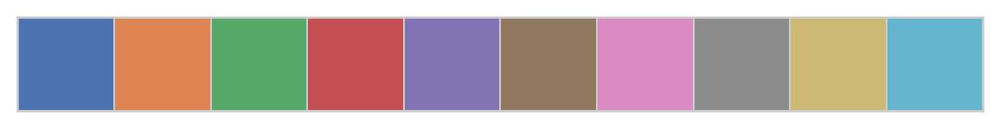

In [6]:
current_palette = sns.color_palette()
sns.palplot(current_palette)

### relplot

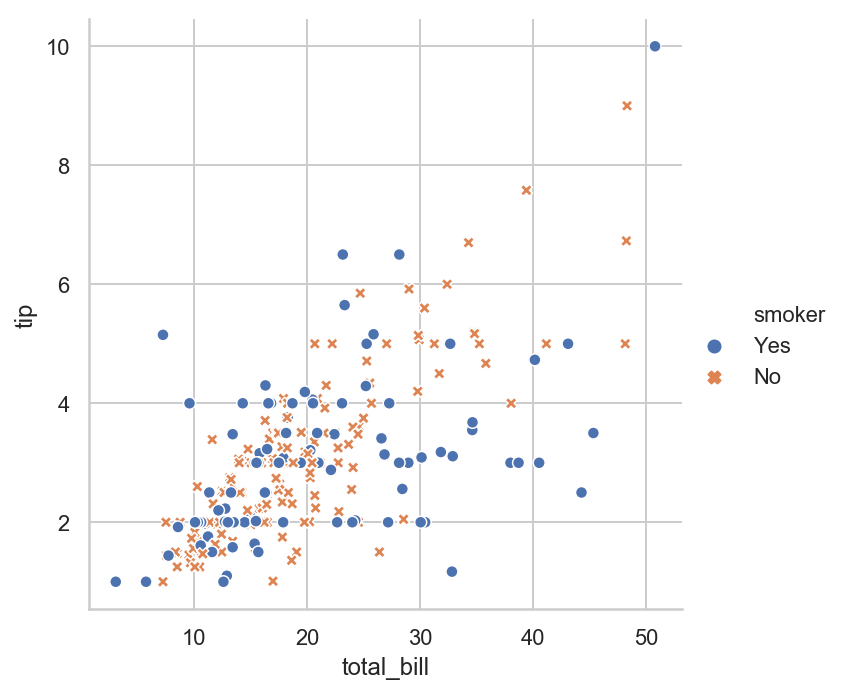

In [11]:
tips = sns.load_dataset("tips")
sns.relplot(x="total_bill", y="tip", hue="smoker", style="smoker",
            data=tips)

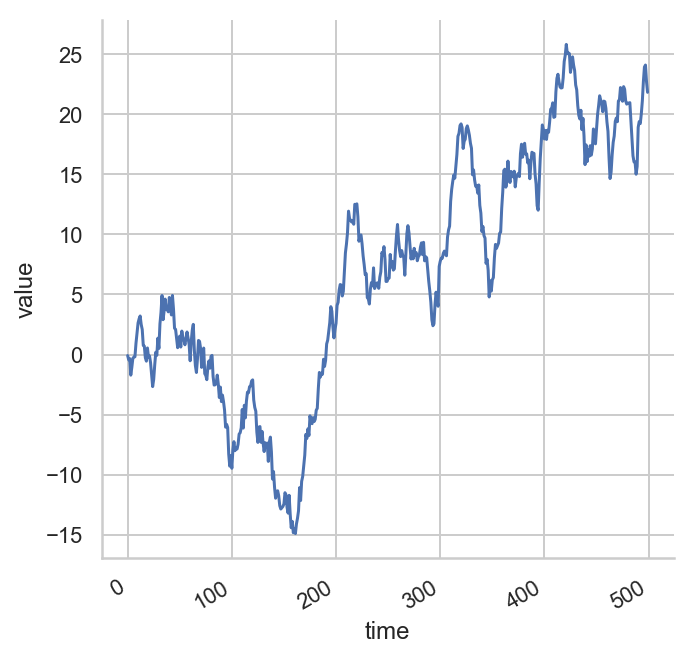

In [8]:
df = pd.DataFrame(dict(time=np.arange(500),
                       value=np.random.randn(500).cumsum()))
g = sns.relplot(x="time", y="value", kind="line", data=df)
g.fig.autofmt_xdate()

### Catplot

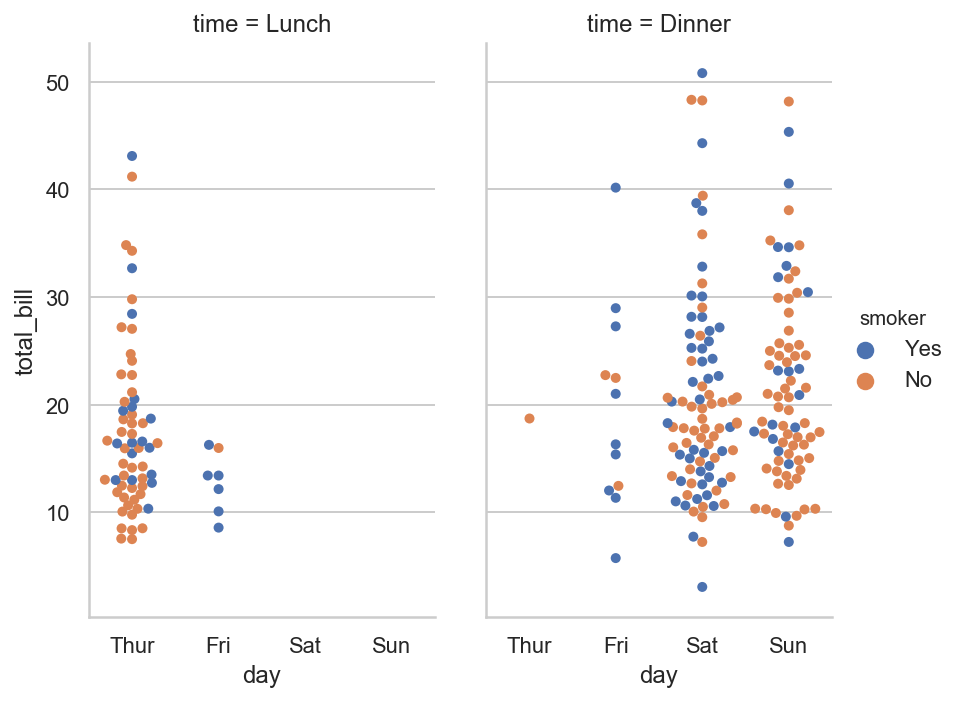

In [12]:
sns.catplot(x="day", y="total_bill", hue="smoker",
            col="time", aspect=.6,
            kind="swarm", data=tips)

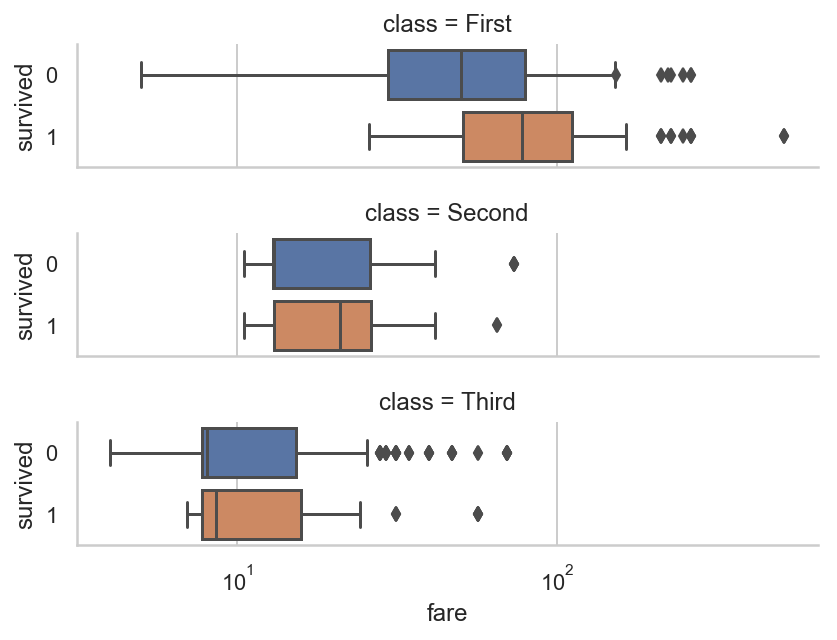

In [14]:
titanic = sns.load_dataset("titanic")
g = sns.catplot(x="fare", y="survived", row="class",
                kind="box", orient="h", height=1.5, aspect=4,
                data=titanic.query("fare > 0"))
g.set(xscale="log");

### Pairplot

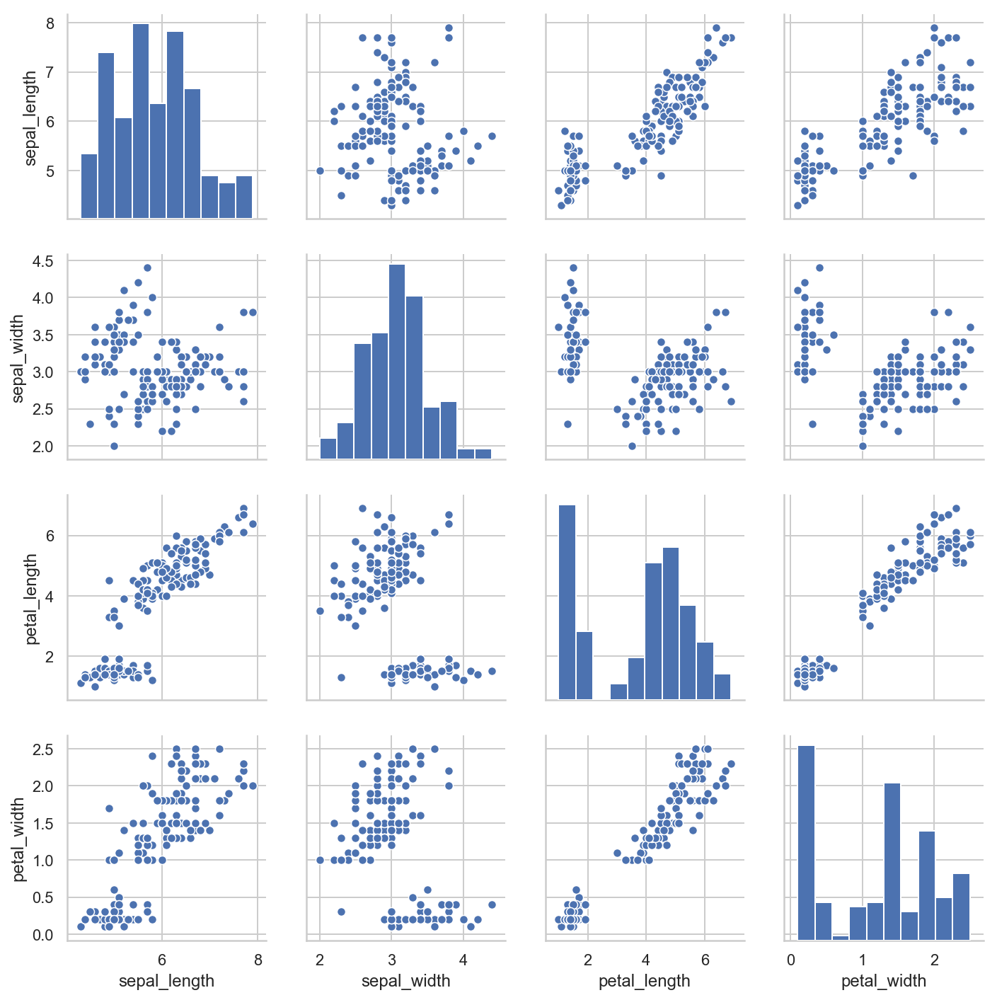

In [16]:
iris = sns.load_dataset("iris")
sns.pairplot(iris)

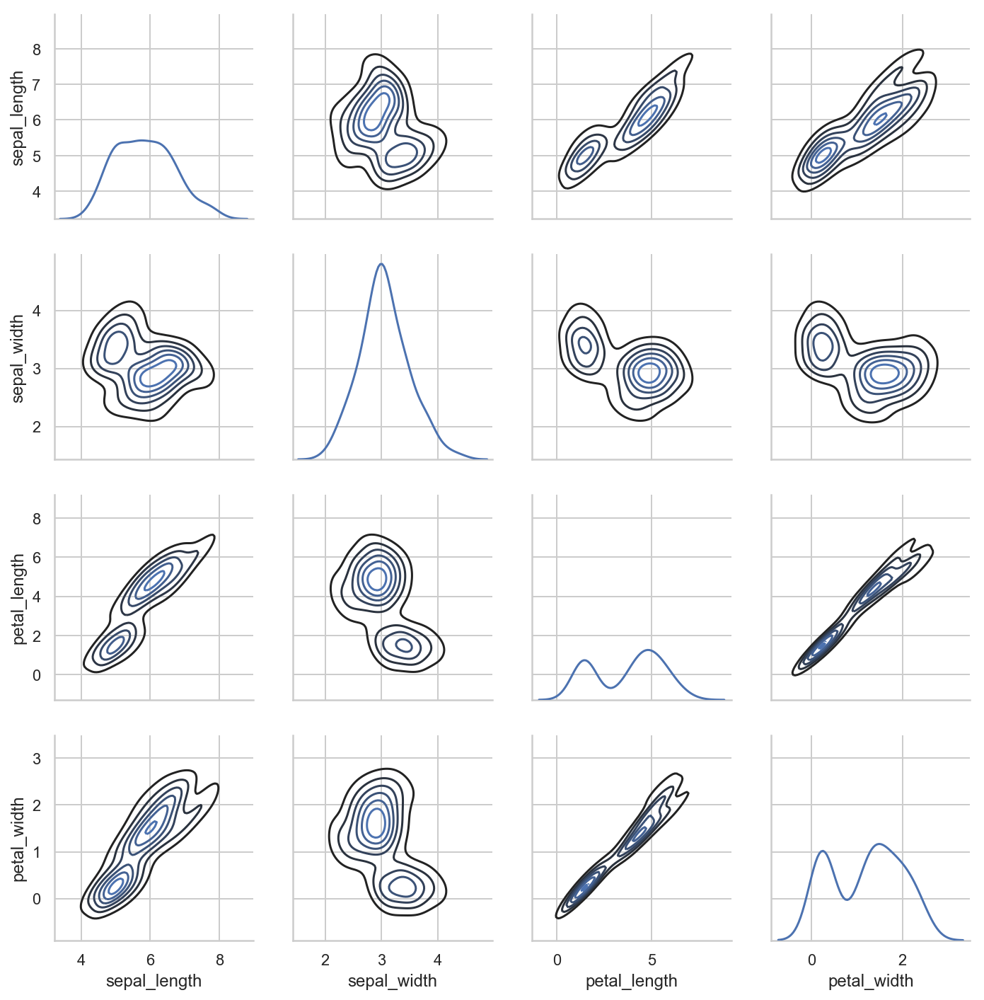

In [17]:
g = sns.PairGrid(iris)
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.kdeplot, n_levels=6);

### Heatmap

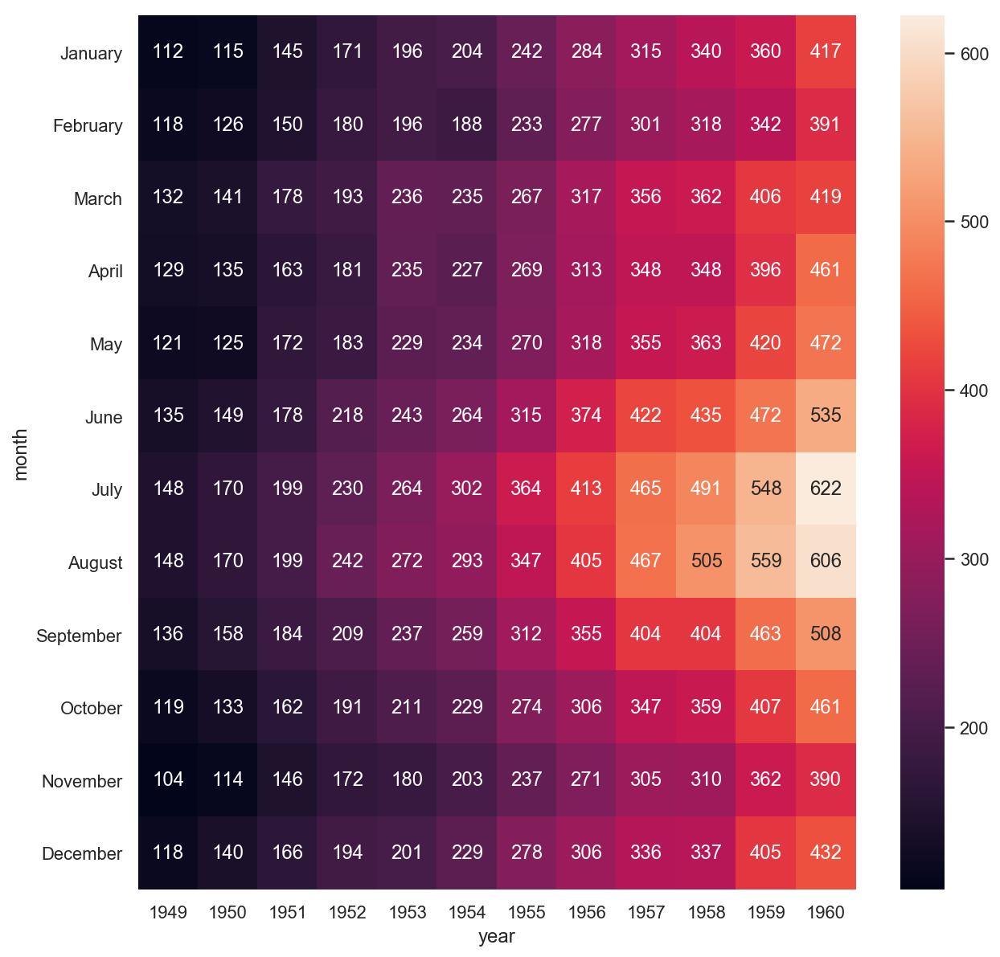

In [29]:
flights = sns.load_dataset("flights")
flights = flights.pivot("month", "year", "passengers")
plt.figure(figsize=(10, 10))
ax = sns.heatmap(flights, annot=True, fmt="d")

## Bokeh

---

- bokeh는 interactive 시각화를 해주는 라이브러리입니다
- 기존 matplotlib, seaborn이 정적인 그래프를 그려주었다면 bokeh는 동적인(interactive) 그래프를 그려줍니다
- [공식 문서](https://mybinder.org/v2/gh/bokeh/bokeh-notebooks/master?filepath=tutorial%2F00%20-%20Introduction%20and%20Setup.ipynb)
- [Demo](http://demo.bokehplots.com/apps/movies) : R Shiny같이 시각화
- 설치
    
    ```
    pip3 install bokeh
    ```

In [83]:
import bokeh
from bokeh.io import output_notebook, show
from bokeh.models import NumeralTickFormatter
from bokeh.plotting import figure
print("bokeh version :", bokeh.__version__)

bokeh version : 0.13.0


In [81]:
output_notebook()

Loading BokehJS ...

In [87]:
p = figure(plot_width=400, plot_height=400, title="My Line Plot")

# add a line renderer
p.line([1, 2, 3, 4, 5], [6, 7, 2, 4, 5], line_width=2)

show(p)

In [84]:
p = figure(plot_height=300, plot_width=800)
p.circle([1,2,3,4,5], [2,5,8,2,7], size=10)

p.xaxis.formatter = NumeralTickFormatter(format="0.0%")
p.yaxis.formatter = NumeralTickFormatter(format="$0.00")

show(p)

In [86]:
from bokeh.layouts import gridplot

# data
x = list(range(11))
y0, y1, y2 = x, [10-i for i in x], [abs(i-5) for i in x]

# create a new plot
s1 = figure(width=250, plot_height=250)
s1.circle(x, y0, size=10, color="navy", alpha=0.5)

# create another one
s2 = figure(width=250, height=250)
s2.triangle(x, y1, size=10, color="firebrick", alpha=0.5)

# create and another
s3 = figure(width=250, height=250)
s3.square(x, y2, size=10, color="olive", alpha=0.5)

# put all the plots in a gridplot
p = gridplot([[s1, s2], [s3, None]], toolbar_location=None)

# show the results
show(p)

In [89]:
import os
from bokeh.models import GMapOptions
from bokeh.plotting import gmap

map_options = GMapOptions(lat=30.2861, lng=-97.7394, map_type="roadmap", zoom=11)

api_key = os.environ["GOOGLE_API_KEY"]

p = gmap(api_key, map_options, title="Austin")

data = dict(lat=[ 30.29,  30.20,  30.29],
            lon=[-97.70, -97.74, -97.78])

p.circle(x="lon", y="lat", size=15, fill_color="blue", fill_alpha=0.8, source=data)

show(p)

## Plotnine
---

- plotnine은 R의 ggplot2에 기반해 그래프를 그려주는 라이브러리입니다
- R로 시각화하는 것이 익숙하신 분들에게 좋을 것 같습니다. 저는 사용해보진 않았습니다!
- [공식 문서](https://plotnine.readthedocs.io/en/stable/)
- 설치

    ```
    pip3 install plotnine
    ```

In [37]:
import plotnine
from plotnine import *
print("plontnine version :",plotnine.__version__)

plontnine version : 0.4.0


In [38]:
n = 10
df = pd.DataFrame({'x': np.arange(n),
                   'y': np.arange(n),
                   'yfit': np.arange(n) + np.tile([-.2, .2], n//2),
                   'cat': ['a', 'b']*(n//2)})

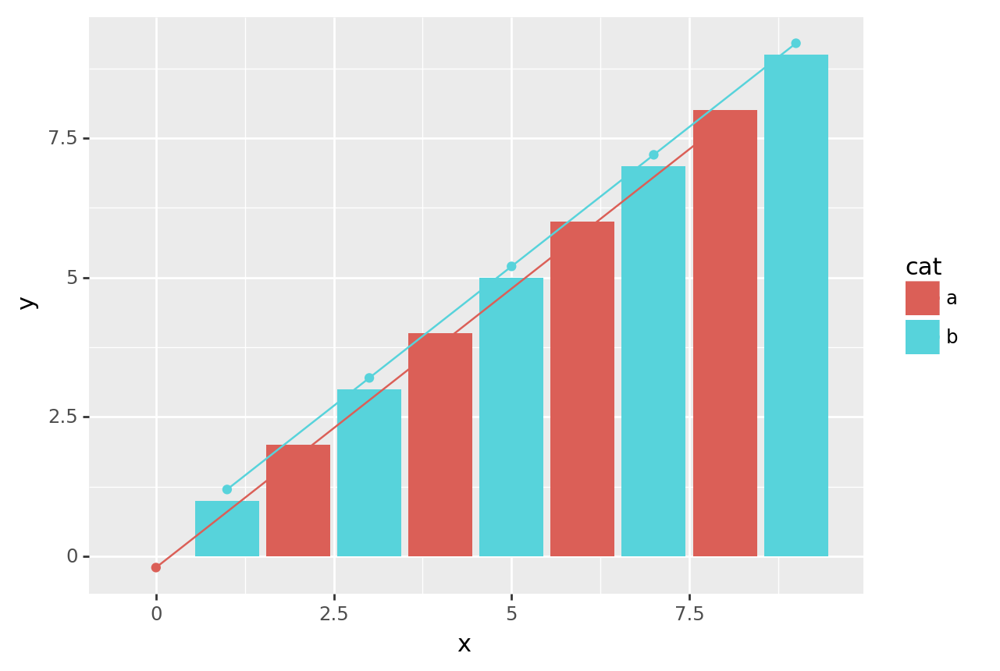

<ggplot: (-9223372036540123623)>

In [39]:
(ggplot(df)
 + geom_col(aes('x', 'y', fill='cat'))
 + geom_point(aes('x', y='yfit', color='cat'))
 + geom_path(aes('x', y='yfit', color='cat'))
)

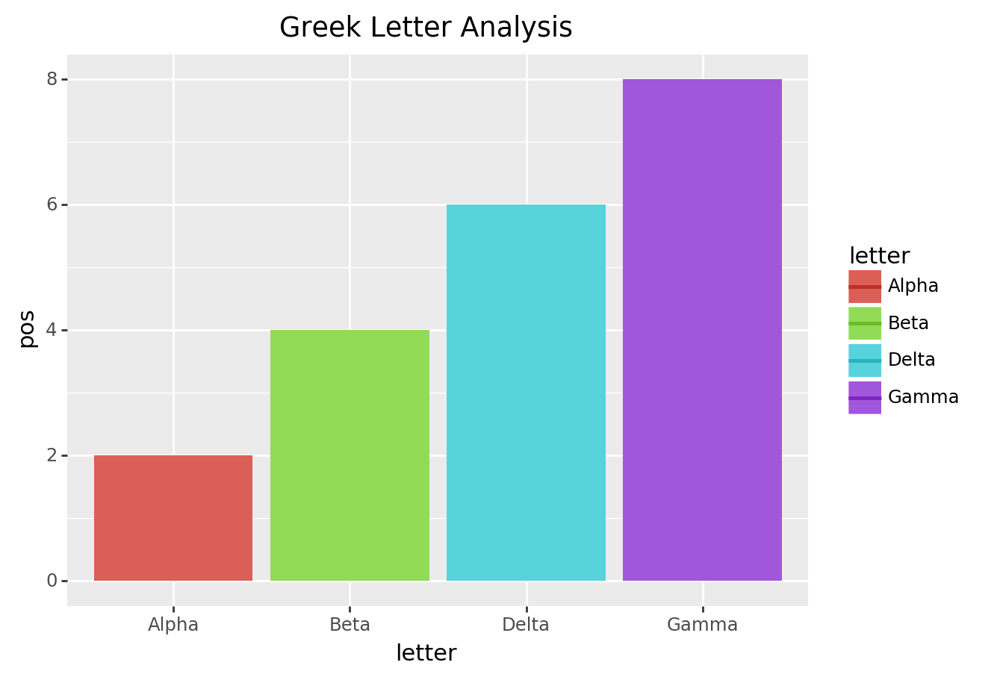

<ggplot: (314703957)>

In [41]:
df2 = pd.DataFrame({
    'letter': ['Alpha', 'Beta', 'Delta', 'Gamma'] * 2,
    'pos': [1, 2, 3, 4] * 2,
    'num_of_letters': [5, 4, 5, 5] * 2
})

(ggplot(df2)
 + geom_col(aes(x='letter',y='pos', fill='letter'))
 + geom_line(aes(x='letter', y='num_of_letters', color='letter'), size=1)
 + scale_color_hue(l=0.45)                                  # some contrast to make the lines stick out
 + ggtitle('Greek Letter Analysis')
)

## Folium
---

- folium은 지도 데이터(Open Street Map)에 ```leaflet.js```를 이용해 위치정보를 시각화하는 라이브러리입니다
- 자바스크립트 기반이라 interactive하게 그래프를 그릴 수 있습니다
- 한국 GeoJSON 데이터는 [southkorea-maps](https://github.com/southkorea/southkorea-maps)에서 확인할 수 있습니다
- 참고 자료
    - [공식 문서]
    - [진현수님의 Github](https://github.com/HyunSu-Jin/seoul_crime/blob/master/seoul_crime.ipynb) : 서울지역 범죄 데이터를 시각화한 노트북 파일입니다
    - [PinkWink님의 블로그](http://pinkwink.kr/1063)
- 설치

    ```
    pip3 install folium
    ```

In [78]:
import folium
print("folium version is", folium.__version__)

folium version is 0.6.0


In [76]:
m = folium.Map(location=[37.5502, 126.982], zoom_start=12)
folium.Marker(location=[37.5502, 126.982], popup="Marker A",
             icon=folium.Icon(icon='cloud')).add_to(m)
folium.Marker(location=[37.5411, 127.0107], popup="한남동",
             icon=folium.Icon(color='red')).add_to(m)
m

## Plot.ly
---

- plotly는 Interactive 그래프를 그려주는 라이브러리입니다
- Scala, R, Python, Javascript, MATLAB 등에서 사용할 수 있습니다
- 시각화를 위해 D3.js를 사용하고 있습니다
- 사용해보면 사용이 쉽고, 세련된 느낌을 받습니다
- Online과 offline이 따로 존재합니다(온라인시 api key 필요) 
- plotly cloud라는 유료 모델도 있습니다
- 설치

    ```
    pip3 install plotly
    ```
    
- 참고 자료
    - [plotly jupyter notebook tutorial](https://plot.ly/python/ipython-notebook-tutorial/)
    - [Plotly를 이용한 캔들차트](http://excelsior-cjh.tistory.com/108)

In [92]:
import plotly
print("plotly version :", plotly.__version__)

plotly version : 3.1.1


In [93]:
plotly.offline.init_notebook_mode() 
plotly.offline.iplot({
"data": [{
    "x": [1, 2, 3],
    "y": [4, 2, 5]
}],
"layout": {
    "title": "hello world"
}
})

In [101]:
import plotly.figure_factory as ff
import plotly.plotly as py
import plotly.graph_objs as go

df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/school_earnings.csv")

table = ff.create_table(df)
plotly.offline.iplot(table, filename='jupyter-table1')

In [103]:
data = [go.Bar(x=df.School,
            y=df.Gap)]

plotly.offline.iplot(data, filename='jupyter-basic_bar')

In [107]:
data = [dict(
        visible = False,
        line=dict(color='#ff0000', width=6),
        name = '𝜈 = '+str(step),
        x = np.arange(0,10,0.01),
        y = np.sin(step*np.arange(0,10,0.01))) for step in np.arange(0,5,0.1)]
data[10]['visible'] = True

steps = []
for i in range(len(data)):
    step = dict(
        method = 'restyle',
        args = ['visible', [False] * len(data)],
    )
    step['args'][1][i] = True # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active = 10,
    currentvalue = {"prefix": "Frequency: "},
    pad = {"t": 50},
    steps = steps
)]

layout = dict(sliders=sliders)
fig = dict(data=data, layout=layout)

plotly.offline.iplot(fig, filename='Sine Wave Slider')

## pyecharts
---

- Baidu에서 데이터 시각화를 위해 만든 Echarts.js의 파이썬 버전입니다
- 정말 다양한 그래프들이 내장되어 있어 레포트를 작성할 때 좋습니다!
- 자바스크립트 기반이기 때문에 Interactive한 그래프를 그려줍니다
- [공식 문서](http://pyecharts.org/#/en-us/)
- 설치

    ```
    pip3 install pyecharts
    ```

In [108]:
import pyecharts
print("pyecharts version : ", pyecharts.__version__)

pyecharts version :  0.5.8


In [109]:
attr = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
v1 = [2.0, 4.9, 7.0, 23.2, 25.6, 76.7, 135.6, 162.2, 32.6, 20.0, 6.4, 3.3]
v2 = [2.6, 5.9, 9.0, 26.4, 28.7, 70.7, 175.6, 182.2, 48.7, 18.8, 6.0, 2.3]
bar = pyecharts.Bar("Bar chart", "precipitation and evaporation one year")
bar.add("precipitation", attr, v1, mark_line=["average"], mark_point=["max", "min"])
bar.add("evaporation", attr, v2, mark_line=["average"], mark_point=["max", "min"])
bar.height = 500
bar.width = 800
bar

In [110]:
attr = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
v1 = [2.0, 4.9, 7.0, 23.2, 25.6, 76.7, 135.6, 162.2, 32.6, 20.0, 6.4, 3.3]
v2 = [2.6, 5.9, 9.0, 26.4, 28.7, 70.7, 175.6, 182.2, 48.7, 18.8, 6.0, 2.3]
bar = pyecharts.Bar("Bar chart", "precipitation and evaporation one year")
bar.use_theme("dark")
bar.add("precipitation", attr, v1, mark_line=["average"], mark_point=["max", "min"])
bar.add("evaporation", attr, v2, mark_line=["average"], mark_point=["max", "min"])
bar.height = 500
bar.width = 800
bar

In [111]:
title = "bar chart2"
index = pd.date_range("8/24/2018", periods=6, freq="M")
df1 = pd.DataFrame(np.random.randn(6), index=index)
df2 = pd.DataFrame(np.random.rand(6), index=index)

dfvalue1 = [i[0] for i in df1.values]
dfvalue2 = [i[0] for i in df2.values]
_index = [i for i in df1.index.format()]

bar = pyecharts.Bar(title, "Profit and loss situation")
bar.add("profit", _index, dfvalue1)
bar.add("loss", _index, dfvalue2)
bar.height = 500
bar.width = 800
bar

In [112]:
from pyecharts import Bar, Line, Overlap

attr = ['A','B','C','D','E','F']
v1 = [10, 20, 30, 40, 50, 60]
v2 = [38, 28, 58, 48, 78, 68]
bar = Bar("Line Bar")
bar.add("bar", attr, v1)
line = Line()
line.add("line", attr, v2)

overlap = Overlap()
overlap.add(bar)
overlap.add(line)

overlap

In [113]:
from pyecharts import Pie

attr = ['A','B','C','D','E','F']
v1 = [10, 20, 30, 40, 50, 60]
v2 = [38, 28, 58, 48, 78, 68]
pie = Pie("pie chart", title_pos="center", width=600)
pie.add("A", attr, v1, center=[25, 50], is_random=True, radius=[30, 75], rosetype='radius')
pie.add("B", attr, v2, center=[75, 50], is_randome=True, radius=[30, 75], rosetype='area', is_legend_show=False,
       is_label_show=True)
pie

In [114]:
bar = Bar("가로 그래프")
bar.add("A", attr, v1)
bar.add("B", attr, v2, is_convert=True)
bar.width=800
bar

In [115]:
import random

attr = ["{}th".format(i) for i in range(30)]
v1 = [random.randint(1, 30) for _ in range(30)]
bar = Bar("Bar - datazoom - slider ")
bar.add("", attr, v1, is_label_show=True, is_datazoom_show=True)
bar

In [116]:
days = ["{}th".format(i) for i in range(30)]
days_v1 = [random.randint(1, 30) for _ in range(30)]
bar = Bar("Bar - datazoom - xaxis/yaxis")
bar.add(
    "",
    days,
    days_v1,
    is_datazoom_show=True,
    datazoom_type="slider",
    datazoom_range=[10, 25],
    is_datazoom_extra_show=True,
    datazoom_extra_type="slider",
    datazoom_extra_range=[10, 25],
    is_toolbox_show=False,
)
bar

### 3D

In [117]:
from pyecharts import Bar3D

bar3d = Bar3D("3D Graph", width=1200, height=600)
x_axis = [
    "12a", "1a", "2a", "3a", "4a", "5a", "6a", "7a", "8a", "9a", "10a", "11a",
    "12p", "1p", "2p", "3p", "4p", "5p", "6p", "7p", "8p", "9p", "10p", "11p"
    ]
y_axis = [
    "Saturday", "Friday", "Thursday", "Wednesday", "Tuesday", "Monday", "Sunday"
    ]
data = [
    [0, 0, 5], [0, 1, 1], [0, 2, 0], [0, 3, 0], [0, 4, 0], [0, 5, 0],
    [0, 6, 0], [0, 7, 0], [0, 8, 0], [0, 9, 0], [0, 10, 0], [0, 11, 2],
    [0, 12, 4], [0, 13, 1], [0, 14, 1], [0, 15, 3], [0, 16, 4], [0, 17, 6],
    [0, 18, 4], [0, 19, 4], [0, 20, 3], [0, 21, 3], [0, 22, 2], [0, 23, 5],
    [1, 0, 7], [1, 1, 0], [1, 2, 0], [1, 3, 0], [1, 4, 0], [1, 5, 0],
    [1, 6, 0], [1, 7, 0], [1, 8, 0], [1, 9, 0], [1, 10, 5], [1, 11, 2],
    [1, 12, 2], [1, 13, 6], [1, 14, 9], [1, 15, 11], [1, 16, 6], [1, 17, 7],
    [1, 18, 8], [1, 19, 12], [1, 20, 5], [1, 21, 5], [1, 22, 7], [1, 23, 2],
    [2, 0, 1], [2, 1, 1], [2, 2, 0], [2, 3, 0], [2, 4, 0], [2, 5, 0],
    [2, 6, 0], [2, 7, 0], [2, 8, 0], [2, 9, 0], [2, 10, 3], [2, 11, 2],
    [2, 12, 1], [2, 13, 9], [2, 14, 8], [2, 15, 10], [2, 16, 6], [2, 17, 5],
    [2, 18, 5], [2, 19, 5], [2, 20, 7], [2, 21, 4], [2, 22, 2], [2, 23, 4],
    [3, 0, 7], [3, 1, 3], [3, 2, 0], [3, 3, 0], [3, 4, 0], [3, 5, 0],
    [3, 6, 0], [3, 7, 0], [3, 8, 1], [3, 9, 0], [3, 10, 5], [3, 11, 4],
    [3, 12, 7], [3, 13, 14], [3, 14, 13], [3, 15, 12], [3, 16, 9], [3, 17, 5],
    [3, 18, 5], [3, 19, 10], [3, 20, 6], [3, 21, 4], [3, 22, 4], [3, 23, 1],
    [4, 0, 1], [4, 1, 3], [4, 2, 0], [4, 3, 0], [4, 4, 0], [4, 5, 1],
    [4, 6, 0], [4, 7, 0], [4, 8, 0], [4, 9, 2], [4, 10, 4], [4, 11, 4],
    [4, 12, 2], [4, 13, 4], [4, 14, 4], [4, 15, 14], [4, 16, 12], [4, 17, 1],
    [4, 18, 8], [4, 19, 5], [4, 20, 3], [4, 21, 7], [4, 22, 3], [4, 23, 0],
    [5, 0, 2], [5, 1, 1], [5, 2, 0], [5, 3, 3], [5, 4, 0], [5, 5, 0],
    [5, 6, 0], [5, 7, 0], [5, 8, 2], [5, 9, 0], [5, 10, 4], [5, 11, 1],
    [5, 12, 5], [5, 13, 10], [5, 14, 5], [5, 15, 7], [5, 16, 11], [5, 17, 6],
    [5, 18, 0], [5, 19, 5], [5, 20, 3], [5, 21, 4], [5, 22, 2], [5, 23, 0],
    [6, 0, 1], [6, 1, 0], [6, 2, 0], [6, 3, 0], [6, 4, 0], [6, 5, 0],
    [6, 6, 0], [6, 7, 0], [6, 8, 0], [6, 9, 0], [6, 10, 1], [6, 11, 0],
    [6, 12, 2], [6, 13, 1], [6, 14, 3], [6, 15, 4], [6, 16, 0], [6, 17, 0],
    [6, 18, 0], [6, 19, 0], [6, 20, 1], [6, 21, 2], [6, 22, 2], [6, 23, 6]
    ]
range_color = ['#313695', '#4575b4', '#74add1', '#abd9e9', '#e0f3f8', '#ffffbf',
               '#fee090', '#fdae61', '#f46d43', '#d73027', '#a50026']
bar3d.add(
    "",
    x_axis,
    y_axis,
    [[d[1], d[0], d[2]] for d in data],
    is_visualmap=True,
    visual_range=[0, 20],
    visual_range_color=range_color,
    grid3d_width=200,
    grid3d_depth=80,
)
bar3d.width=700
bar3d.height=500

bar3d

In [118]:
from pyecharts import Boxplot

boxplot = Boxplot("Box plot")
x_axis = ['expr1', 'expr2', 'expr3', 'expr4', 'expr5']
y_axis = [
    [850, 740, 900, 1070, 930, 850, 950, 980, 980, 880,
    1000, 980, 930, 650, 760, 810, 1000, 1000, 960, 960],
    [960, 940, 960, 940, 880, 800, 850, 880, 900, 840,
    830, 790, 810, 880, 880, 830, 800, 790, 760, 800],
    [880, 880, 880, 860, 720, 720, 620, 860, 970, 950,
    880, 910, 850, 870, 840, 840, 850, 840, 840, 840],
    [890, 810, 810, 820, 800, 770, 760, 740, 750, 760,
    910, 920, 890, 860, 880, 720, 840, 850, 850, 780],
    [890, 840, 780, 810, 760, 810, 790, 810, 820, 850,
    870, 870, 810, 740, 810, 940, 950, 800, 810, 870]
]
_yaxis = boxplot.prepare_data(y_axis)       
boxplot.add("boxplot", x_axis, _yaxis)
boxplot

In [119]:
from pyecharts import Funnel

attr = ["A", "B", "C", "D", "E", "F"]
value = [20, 40, 60, 80, 100, 120]
funnel = Funnel("퍼널 그래프")
funnel.add(
    "퍼널",
    attr,
    value,
    is_label_show=True,
    label_pos="inside",
    label_text_color="#fff",
)
funnel.width=700
funnel.height=500
funnel

In [120]:
from pyecharts import Gauge

gauge = Gauge("Gauge Graph")
gauge.add("이용률", "가운데", 66.66)
gauge